# Multi-Disease Detection in Tomato Plant 
# Part 1: Classification Models

In [1]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'tomatoleaf:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F619181%2F1105687%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240308%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240308T054904Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D046bd9b3dd162fc266d27e36190eabda370676d68f1436ddafd6eebdb55ba424839ba3f01082bebc2f8378bb2320e769030fda2012374a69cdc306087b0b635977596b66866dd9ac55af406603dd6a942364185db9f10d0828c1a13693110b84ca93c408390d84a461302fb608b06b395e4c65ceb196b2ba5de6c0ad21599a44a766fee88cb895e612dac229ce40176d7c226edb2929aa3ef2040459b6ad559c4fc74e99db55df63d885796c2541136904f6b1c888df9f67c8b3b3a2ff3e0f893e48ca253e8474170aaf31bdb95b02f12734c86278ac7dd3ce3de749a7ca8cf74f19c8fd4482d60e15ee37a7d57ab19161c8d30fb2a5fbf670b1dba19485cbe1'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


[==================================================] 187559775 bytes downloaded
Downloaded and uncompressed: tomatoleaf
Data source import complete.


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
# from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Input, Dropout, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, recall_score, precision_score, f1_score
plt.rcParams['figure.figsize']= (20,8)

In [3]:
batchSize = 32
imageShape = (224, 224)
epochs = 10
channels = 3

In [4]:
train_dir = "/kaggle/input/tomatoleaf/tomato/train"
val_dir = "/kaggle/input/tomatoleaf/tomato/val"

In [5]:
train_gen = ImageDataGenerator(rescale=(1./255.), validation_split=0.2)
val_gen = ImageDataGenerator(rescale=(1./255.))

In [6]:
train_ds = train_gen.flow_from_directory(train_dir,target_size=imageShape,batch_size=batchSize, subset='training', class_mode='categorical')
val_ds = train_gen.flow_from_directory(train_dir,target_size=imageShape,batch_size=batchSize, subset='validation', class_mode='categorical')

Found 8000 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.


In [7]:
test_ds = val_gen.flow_from_directory(val_dir,target_size=imageShape,batch_size=batchSize, class_mode='categorical')

Found 1000 images belonging to 10 classes.


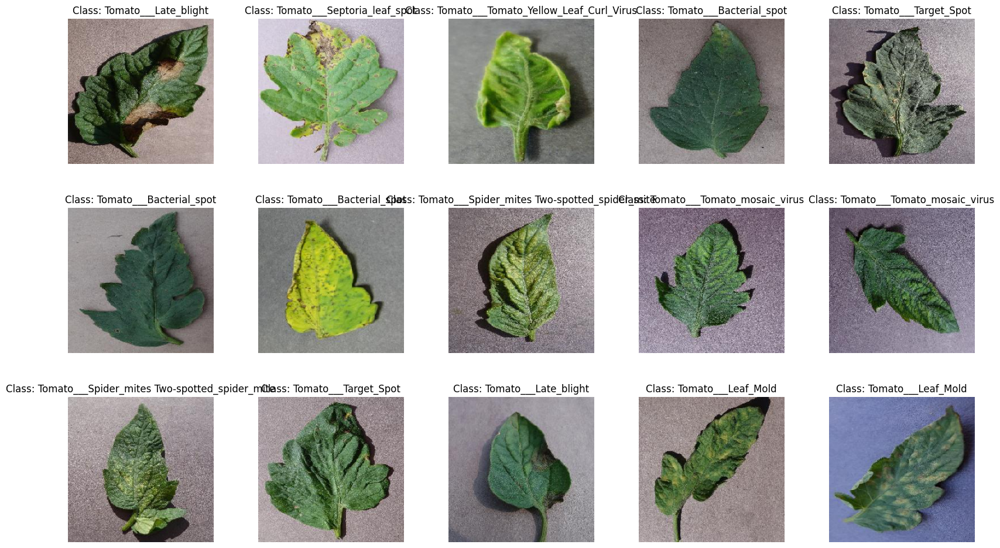

In [8]:
labels = [k for k in train_ds.class_indices]
sample_generate = train_ds.__next__()
images = sample_generate[0]
titles = sample_generate[1]
plt.figure(figsize = (20 , 20))

for i in range(15):
    plt.subplot(5 , 5, i+1)
    plt.subplots_adjust(hspace = 0.3 , wspace = 0.3)
    plt.imshow(images[i])
    plt.title(f'Class: {labels[np.argmax(titles[i],axis=0)]}')
    plt.axis("off")

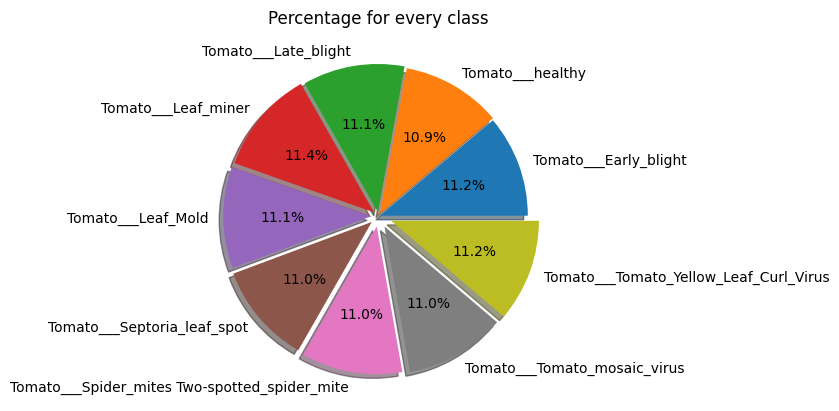

In [ ]:
plt.pie([len(y_train[y_train == 0]), len(y_train[y_train == 1]), len(y_train[y_train == 2]), len(y_train[y_train == 3]),
          len(y_train[y_train == 4]), len(y_train[y_train == 5]), len(y_train[y_train == 6]), len(y_train[y_train == 7]),
          len(y_train[y_train == 8])],  
         labels=Categories, autopct="%1.1f%%", shadow=True, explode=[i for i in np.arange(0.01, 0.1, 0.01)])  

plt.title("Percentage for every class")
plt.show()

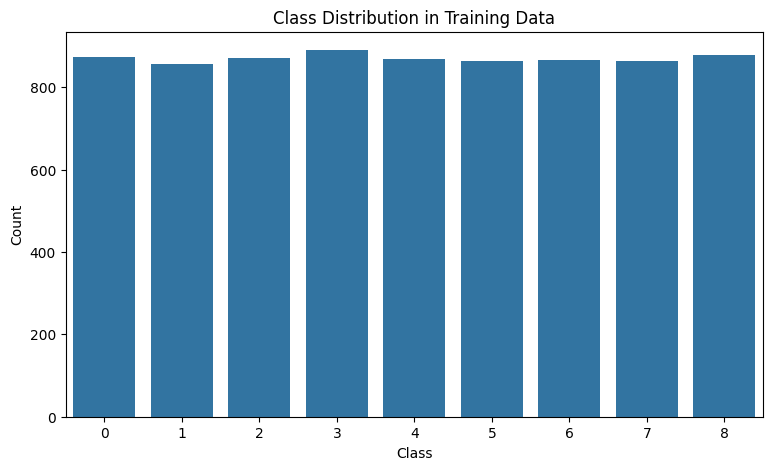

In [ ]:
plt.figure(figsize=(9, 5))
sns.countplot(x=y_train)
plt.title('Class Distribution in Training Data')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

## Background Removal

In [ ]:
# Background removal
import cv2
import numpy as np

# Function to remove background using GrabCut algorithm with GMM and MRF
def remove_background_advanced(image, mean_pixel_value=120):
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Initialize GMM parameters
    gmm_model = cv2.createBackgroundSubtractorMOG2()

    # Apply GMM to the grayscale image
    fg_mask = gmm_model.apply(gray)

    # Create a binary mask
    _, binary_mask = cv2.threshold(fg_mask, 244, 255, cv2.THRESH_BINARY)

    # Define the kernel for morphological operations
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))

    # Perform morphological closing to fill small holes in the foreground mask
    binary_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, kernel)

    # Apply GrabCut algorithm to refine the segmentation
    mask = np.zeros(image.shape[:2], np.uint8)
    mask[binary_mask == 0] = cv2.GC_BGD
    mask[binary_mask == 255] = cv2.GC_PR_FGD

    # Create background and foreground models
    bgd_model = np.zeros((1, 65), np.float64)
    fgd_model = np.zeros((1, 65), np.float64)

    # Define the rectangle enclosing the foreground object
    rect = (0, 0, image.shape[1]-1, image.shape[0]-1)

    # Apply GrabCut algorithm with mask refinement
    cv2.grabCut(image, mask, rect, bgd_model, fgd_model, 5, cv2.GC_INIT_WITH_MASK)

    # Mask the image to remove background
    mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
    img_without_bg = image * mask2[:, :, np.newaxis]

    return img_without_bg

# Main function
def main():
    # Set project and dataset directories
    project_dir = "C:/Users/ambar/OneDrive - vit.ac.in/Capstone Project"
    dataset_dir = os.path.join(project_dir, "Tomata Leaf Disease Dataset 0/tomato")
    output_dir = os.path.join(dataset_dir, "background_removed_grabcut")

    # Create output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)

    # Process images in train and val directories
    for split in ["train", "val"]:
        split_dir = os.path.join(dataset_dir, split)
        classes = os.listdir(split_dir)
        for class_name in classes:
            class_dir = os.path.join(split_dir, class_name)
            output_class_dir = os.path.join(output_dir, split, class_name)
            os.makedirs(output_class_dir, exist_ok=True)

            images = os.listdir(class_dir)
            for image_name in images:
                image_path = os.path.join(class_dir, image_name)
                output_path = os.path.join(output_class_dir, image_name)
                remove_background_grabcut(image_path, output_path)

if __name__ == "__main__":
    main()

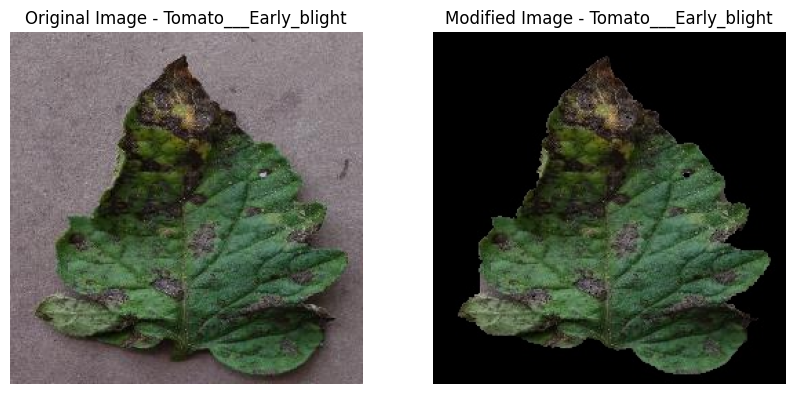

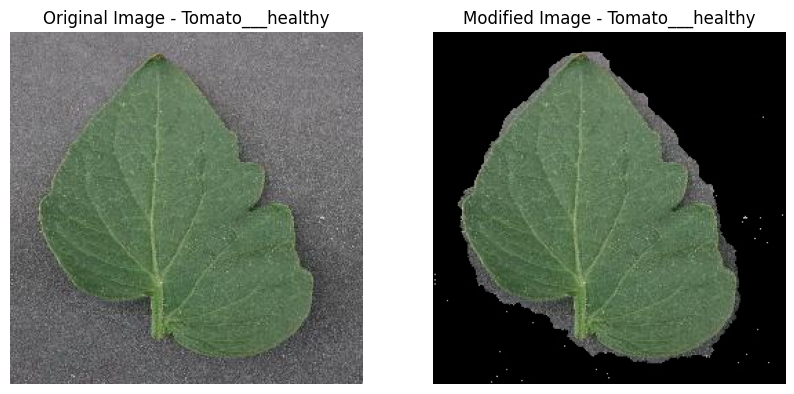

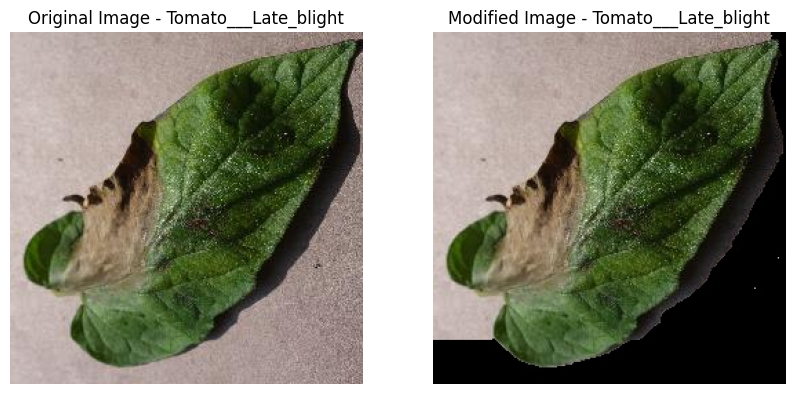

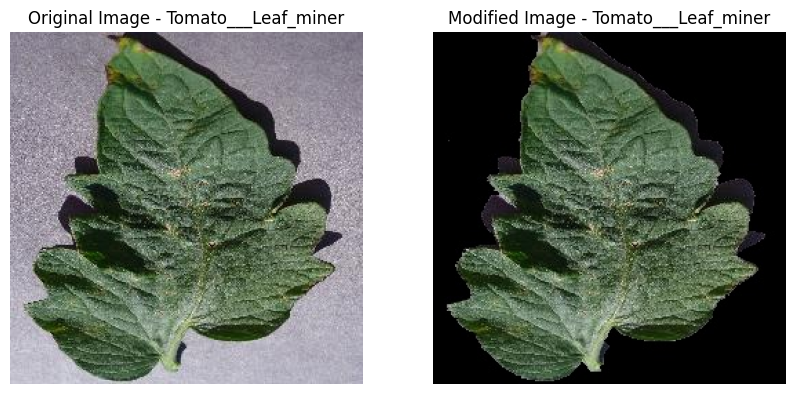

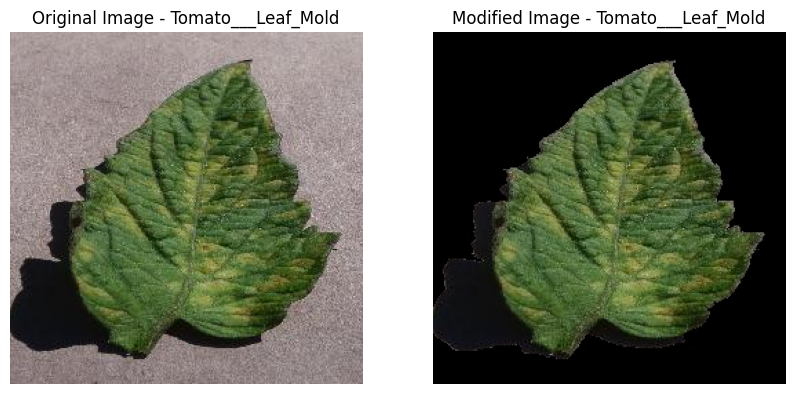

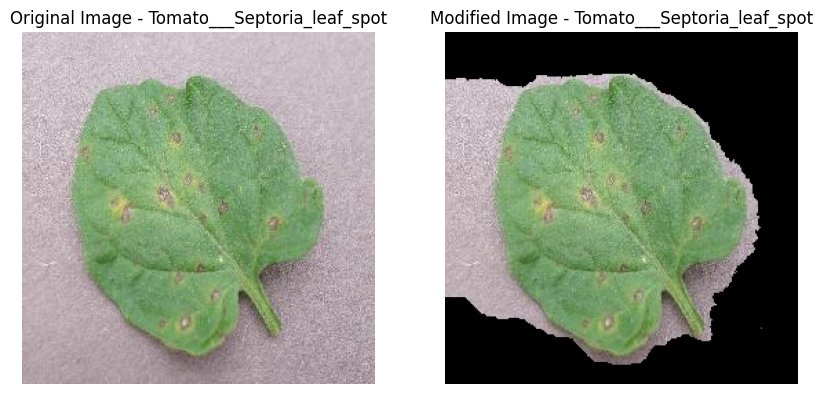

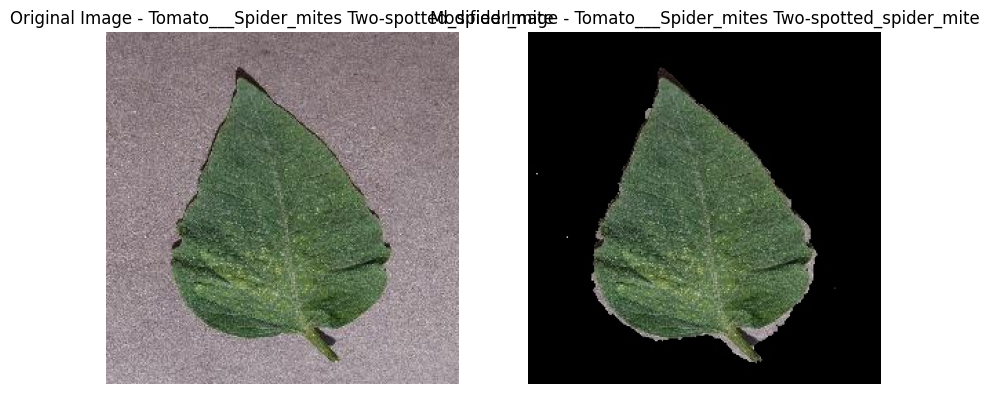

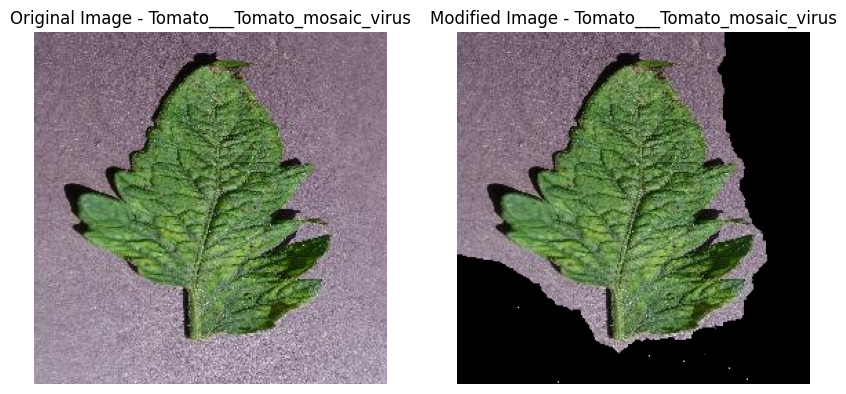

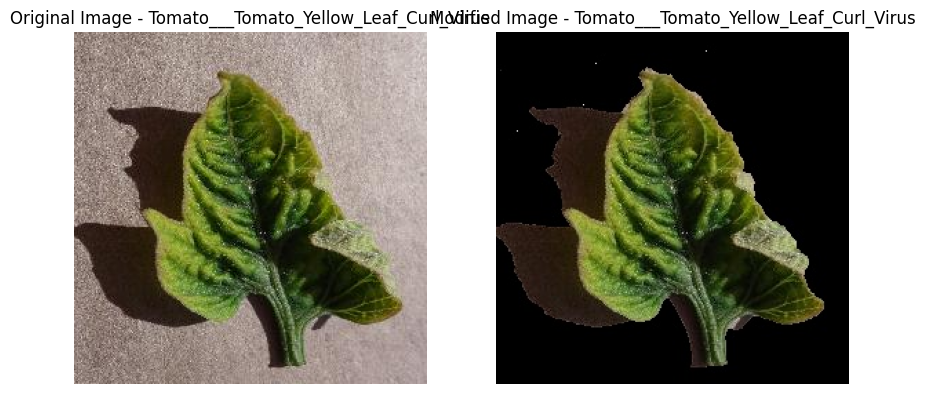

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# Function to display image comparison
def display_image_comparison(original_image, modified_image, class_name):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Original Image - ' + class_name)
    axes[0].axis('off')
    axes[1].imshow(cv2.cvtColor(modified_image, cv2.COLOR_BGR2RGB))
    axes[1].set_title('Modified Image - ' + class_name)
    axes[1].axis('off')
    plt.show()

# Main function
def main():
    # Set directories
    original_images_dir = "C:/Users/ambar/OneDrive - vit.ac.in/Capstone Project/Tomata Leaf Disease Dataset 0/tomato/train"
    modified_images_dir = "C:/Users/ambar/OneDrive - vit.ac.in/Capstone Project/Tomata Leaf Disease Dataset 0/tomato/background_removed_grabcut/train"

    # Get list of classes
    classes = os.listdir(modified_images_dir)

    # Process images for each class
    for class_name in classes:
        # Get paths for one image from each class
        original_image_path = os.path.join(original_images_dir, class_name, os.listdir(os.path.join(original_images_dir, class_name))[114])
        modified_image_path = os.path.join(modified_images_dir, class_name, os.listdir(os.path.join(modified_images_dir, class_name))[114])

        # Read images
        original_image = cv2.imread(original_image_path)
        modified_image = cv2.imread(modified_image_path)

        # Display image comparison
        display_image_comparison(original_image, modified_image, class_name)

if __name__ == "__main__":
    main()

## VGG16 model

In [9]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam

# Load the pre-trained VGG16 model without including the top (fully connected) layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Create a new model
model_VGG16 = Sequential()

# Add the VGG16 layers (excluding the last two layers)
for layer in base_model.layers[:-2]:
    model_VGG16.add(layer)

# Add custom layers on top of VGG16
model_VGG16.add(Flatten())
model_VGG16.add(Dense(256, activation='relu'))
model_VGG16.add(Dropout(0.5))
model_VGG16.add(Dense(10, activation='softmax'))  # 10 classes

# Freeze the layers of the pre-trained model
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model_VGG16.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Print model summary to verify the architecture
# model_VGG16.summary()

58889256/58889256 [==============================] - 0s 0us/step


In [10]:
history = model_VGG16.fit(
    train_ds,
    steps_per_epoch=train_ds.samples // 32,
    validation_data=val_ds,
    validation_steps=val_ds.samples // 32,
    epochs=10
)

Epoch 1/10
250/250 [==============================] - 54s 172ms/step - loss: 2.7467 - accuracy: 0.3549 - val_loss: 1.2928 - val_accuracy: 0.6426
Epoch 2/10
250/250 [==============================] - 44s 177ms/step - loss: 1.4784 - accuracy: 0.4341 - val_loss: 0.9074 - val_accuracy: 0.7480
Epoch 3/10
250/250 [==============================] - 45s 179ms/step - loss: 1.3543 - accuracy: 0.4754 - val_loss: 0.8800 - val_accuracy: 0.7223
Epoch 4/10
250/250 [==============================] - 46s 184ms/step - loss: 1.2765 - accuracy: 0.4984 - val_loss: 0.7967 - val_accuracy: 0.7863
Epoch 5/10
250/250 [==============================] - 44s 178ms/step - loss: 1.1889 - accuracy: 0.5271 - val_loss: 0.7167 - val_accuracy: 0.8034
Epoch 6/10
250/250 [==============================] - 44s 177ms/step - loss: 1.1250 - accuracy: 0.5414 - val_loss: 0.6025 - val_accuracy: 0.8155
Epoch 7/10
250/250 [==============================] - 46s 183ms/step - loss: 1.1168 - accuracy: 0.5454 - val_loss: 0.6084 - val_ac

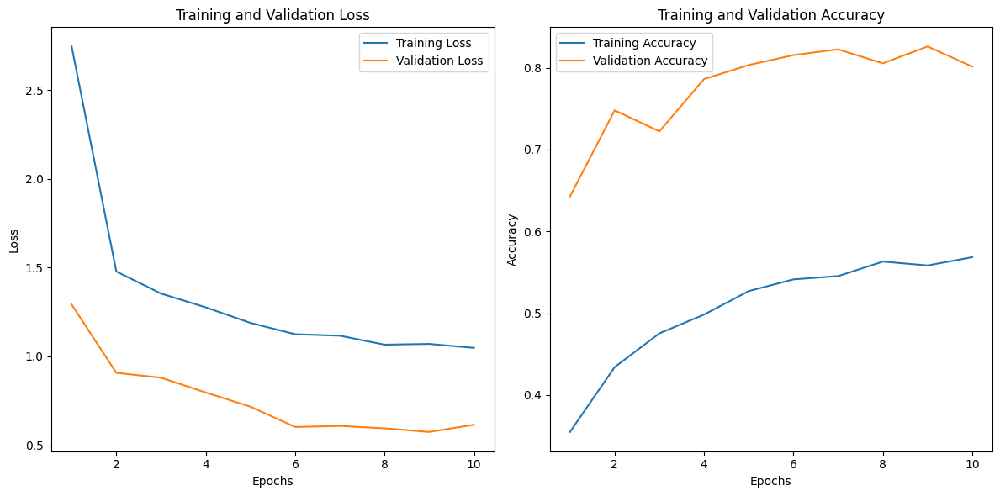

In [11]:
import matplotlib.pyplot as plt

# Access training history
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(range(1, len(train_loss) + 1), train_loss, label='Training Loss')
plt.plot(range(1, len(val_loss) + 1), val_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(range(1, len(train_accuracy) + 1), train_accuracy, label='Training Accuracy')
plt.plot(range(1, len(val_accuracy) + 1), val_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [12]:
model_VGG16.save('/kaggle/working/Tomato_VGG16_kaggle.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [13]:
# Test Accuracy
test_loss, test_accuracy = model_VGG16.evaluate(test_ds)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

32/32 [==============================] - 7s 212ms/step - loss: 0.7027 - accuracy: 0.7730
Test Loss: 0.7027
Test Accuracy: 0.7730


In [14]:
# Evaluate the model on the test set
loss, accuracy = model_VGG16.evaluate(test_ds)
print(f"Test Accuracy: {accuracy*100:.2f}%")
print(f"Test Loss: {loss:.4f}")

32/32 [==============================] - 4s 137ms/step - loss: 0.7027 - accuracy: 0.7730
Test Accuracy: 77.30%
Test Loss: 0.7027


In [15]:
# The Prediction
prediction = model_VGG16.predict(test_ds)
prediction

32/32 [==============================] - 5s 142ms/step


array([[2.5296265e-06, 2.6884474e-04, 9.9838281e-01, ..., 5.8706784e-05,
        7.5792883e-09, 4.1843040e-07],
       [4.0829592e-04, 2.3596948e-02, 8.6451700e-04, ..., 3.1390302e-02,
        5.0335473e-01, 1.2829107e-02],
       [7.6842122e-02, 1.1964993e-02, 6.1406693e-03, ..., 4.2787229e-04,
        7.1700956e-06, 1.1355381e-02],
       ...,
       [1.3048539e-08, 1.9248168e-04, 4.8736350e-08, ..., 2.0438201e-04,
        9.7570747e-01, 7.4565975e-07],
       [7.8335870e-03, 3.1314998e-05, 1.5462507e-05, ..., 1.5786309e-04,
        4.7455993e-07, 1.0120200e-01],
       [1.4257050e-02, 5.6883311e-01, 3.5469282e-01, ..., 5.1511370e-04,
        1.6119395e-05, 2.9499427e-06]], dtype=float32)

In [16]:
predictions = []
for i in range(len(prediction)):
    predictions.append(np.argmax(prediction[i]))
print(predictions[:20])

[2, 8, 6, 2, 6, 1, 1, 7, 3, 2, 8, 5, 1, 6, 6, 5, 8, 9, 7, 2]


In [17]:
# Generate predictions using the model
predictions = model_VGG16.predict(val_gen.flow_from_directory(val_dir, target_size=imageShape, batch_size=batchSize, class_mode='categorical', shuffle=False))

Found 1000 images belonging to 10 classes.
32/32 [==============================] - 5s 144ms/step


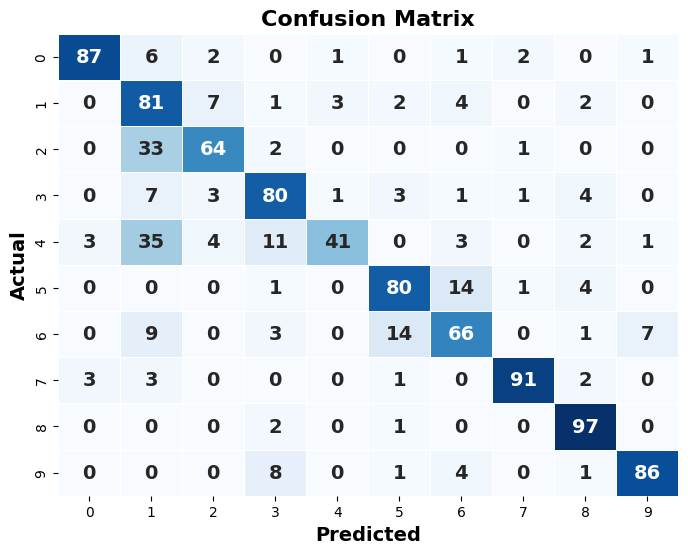

In [18]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Get the true labels
true_labels = test_ds.classes

# Get the predicted labels
predicted_labels = np.argmax(predictions, axis=1)

# Compute the confusion matrix
confusion = confusion_matrix(true_labels, predicted_labels)

# Create a heatmap with Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', cbar=False,
            annot_kws={'size': 14, 'weight': 'bold'}, linewidths=.5)

# Customize labels and title
plt.xlabel('Predicted', fontsize=14, fontweight='bold')
plt.ylabel('Actual', fontsize=14, fontweight='bold')
plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
plt.show()


In [19]:
print("\033[1mThe Classification Report on Test Data\033[0m\n")
classification_rep = classification_report(true_labels, predicted_labels)
print(classification_rep)

The Classification Report on Test Data

              precision    recall  f1-score   support

           0       0.94      0.87      0.90       100
           1       0.47      0.81      0.59       100
           2       0.80      0.64      0.71       100
           3       0.74      0.80      0.77       100
           4       0.89      0.41      0.56       100
           5       0.78      0.80      0.79       100
           6       0.71      0.66      0.68       100
           7       0.95      0.91      0.93       100
           8       0.86      0.97      0.91       100
           9       0.91      0.86      0.88       100

    accuracy                           0.77      1000
   macro avg       0.80      0.77      0.77      1000
weighted avg       0.80      0.77      0.77      1000



## InceptionV3 Model

In [20]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Load InceptionV3 base model without top classification layers
base_model_IN_V3 = InceptionV3(weights='imagenet', include_top=False)
# Freeze layers in the base model
for layer in base_model_IN_V3.layers:
    layer.trainable = False

# Add custom classification layers
x = base_model_IN_V3.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(10, activation='softmax')(x)  # num_classes is the number of disease classes

# Create the final model
model_IN_V3 = Model(inputs=base_model_IN_V3.input, outputs=predictions)



# Compile the model
model_IN_V3.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

87910968/87910968 [==============================] - 0s 0us/step


In [21]:
history = model_IN_V3.fit(
    train_ds,
    steps_per_epoch=train_ds.samples // 32,
    validation_data=val_ds,
    validation_steps=val_ds.samples // 32,
    epochs=10
)

Epoch 1/10
250/250 [==============================] - 36s 106ms/step - loss: 1.2920 - accuracy: 0.5766 - val_loss: 0.8108 - val_accuracy: 0.7268
Epoch 2/10
250/250 [==============================] - 25s 101ms/step - loss: 0.8551 - accuracy: 0.7017 - val_loss: 0.6680 - val_accuracy: 0.7747
Epoch 3/10
250/250 [==============================] - 25s 100ms/step - loss: 0.7401 - accuracy: 0.7425 - val_loss: 0.6482 - val_accuracy: 0.7762
Epoch 4/10
250/250 [==============================] - 25s 100ms/step - loss: 0.6496 - accuracy: 0.7695 - val_loss: 0.6431 - val_accuracy: 0.7848
Epoch 5/10
250/250 [==============================] - 26s 102ms/step - loss: 0.6074 - accuracy: 0.7844 - val_loss: 0.5722 - val_accuracy: 0.7974
Epoch 6/10
250/250 [==============================] - 25s 100ms/step - loss: 0.5747 - accuracy: 0.7979 - val_loss: 0.5099 - val_accuracy: 0.8311
Epoch 7/10
250/250 [==============================] - 25s 101ms/step - loss: 0.5409 - accuracy: 0.8050 - val_loss: 0.5069 - val_ac

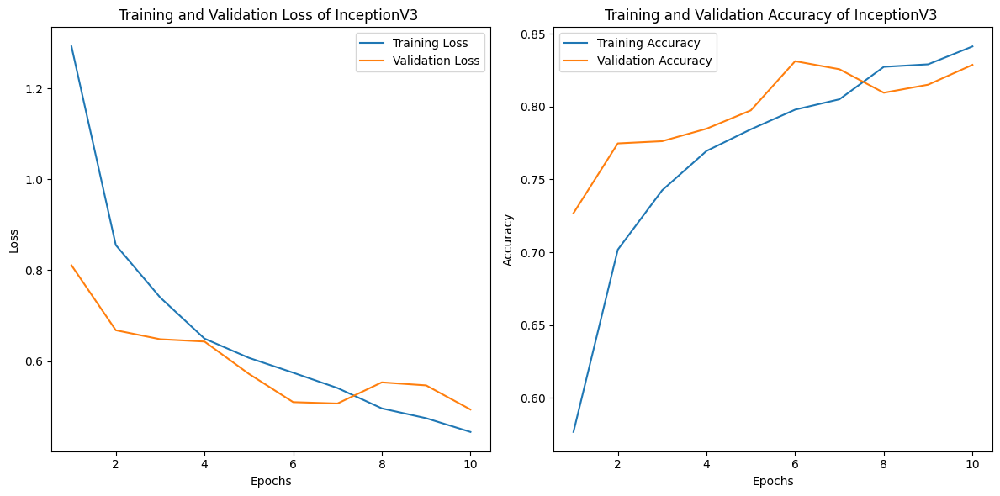

In [22]:
import matplotlib.pyplot as plt

# Access training history
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(range(1, len(train_loss) + 1), train_loss, label='Training Loss')
plt.plot(range(1, len(val_loss) + 1), val_loss, label='Validation Loss')
plt.title('Training and Validation Loss of InceptionV3 ')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(range(1, len(train_accuracy) + 1), train_accuracy, label='Training Accuracy')
plt.plot(range(1, len(val_accuracy) + 1), val_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy of InceptionV3 ')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [23]:
model_IN_V3.save('/kaggle/working/Tomato_IN_V3_kaggle.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [24]:
# Test Accuracy
test_loss, test_accuracy = model_IN_V3.evaluate(test_ds)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

32/32 [==============================] - 4s 132ms/step - loss: 0.6294 - accuracy: 0.7950
Test Loss: 0.6294
Test Accuracy: 0.7950


In [25]:
# Generate predictions using the model
predictions = model_IN_V3.predict(val_gen.flow_from_directory(val_dir, target_size=imageShape, batch_size=batchSize, class_mode='categorical', shuffle=False))

Found 1000 images belonging to 10 classes.
32/32 [==============================] - 4s 88ms/step


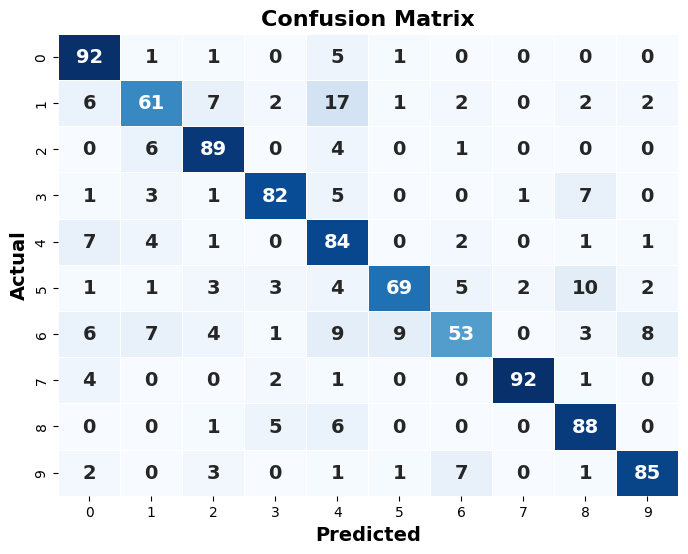

In [26]:
# Confusion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Get the true labels
true_labels = test_ds.classes

# Get the predicted labels
predicted_labels = np.argmax(predictions, axis=1)

# Compute the confusion matrix
confusion = confusion_matrix(true_labels, predicted_labels)

# Create a heatmap with Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', cbar=False,
            annot_kws={'size': 14, 'weight': 'bold'}, linewidths=.5)

# Customize labels and title
plt.xlabel('Predicted', fontsize=14, fontweight='bold')
plt.ylabel('Actual', fontsize=14, fontweight='bold')
plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
plt.show()

In [27]:
print("\033[1mThe Classification Report on Test Data\033[0m\n")
classification_rep = classification_report(true_labels, predicted_labels)
print(classification_rep)

The Classification Report on Test Data

              precision    recall  f1-score   support

           0       0.77      0.92      0.84       100
           1       0.73      0.61      0.67       100
           2       0.81      0.89      0.85       100
           3       0.86      0.82      0.84       100
           4       0.62      0.84      0.71       100
           5       0.85      0.69      0.76       100
           6       0.76      0.53      0.62       100
           7       0.97      0.92      0.94       100
           8       0.78      0.88      0.83       100
           9       0.87      0.85      0.86       100

    accuracy                           0.80      1000
   macro avg       0.80      0.80      0.79      1000
weighted avg       0.80      0.80      0.79      1000



1/1 [==============================] - 0s 28ms/step


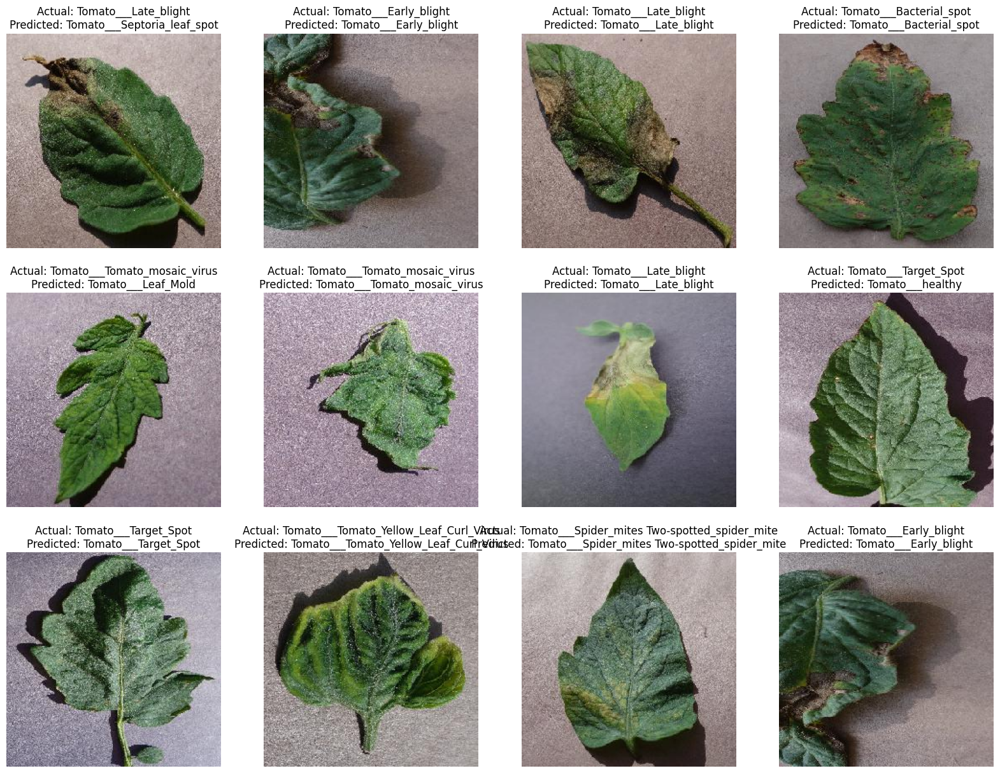

In [28]:
# Visualizing Predictions
def predictImages(data, class_names, model):

    r, c = 3, 4
    imgLen = r * c
    plt.figure(figsize=(20, 15))
    i = 1
    counter = 0

    while counter < imgLen:
        images, labels = next(data)
        for j in range(len(images)):
            img = np.expand_dims(images[j], axis=0)

            plt.subplot(r, c, i)
            plt.imshow(img[0])

            predicted = model.predict(img)
            predicted = class_names[np.argmax(predicted)]
            actual = class_names[np.argmax(labels[j])]

            plt.title(f"Actual: {actual}\nPredicted: {predicted}")
            plt.axis('off')

            i += 1
            counter += 1

            if i > imgLen:
                break

    plt.show()

class_names = sorted(os.listdir(train_dir))
predictImages(test_ds, class_names, model_IN_V3)


## ResNet-101

In [29]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet101
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout

# Load the ResNet-101 base model
base_model_resnet = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Create a Sequential model
model_resnet101 = Sequential()

# Add the ResNet-101 base model
model_resnet101.add(base_model_resnet)

# Add custom classification layers
model_resnet101.add(GlobalAveragePooling2D())
model_resnet101.add(Dense(1024, activation='relu'))
model_resnet101.add(Dropout(0.5))
model_resnet101.add(Dense(10, activation='softmax'))  # num_classes is the number of disease classes (adjust to your dataset)

# Compile the model
model_resnet101.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


171446536/171446536 [==============================] - 1s 0us/step


In [30]:
history_resnet101 = model_resnet101.fit(
    train_ds,
    steps_per_epoch=train_ds.samples // 32,
    validation_data=val_ds,
    validation_steps=val_ds.samples // 32,
    epochs=10
)

Epoch 1/10
250/250 [==============================] - 259s 712ms/step - loss: 0.8276 - accuracy: 0.7398 - val_loss: 10.5468 - val_accuracy: 0.0998
Epoch 2/10
250/250 [==============================] - 166s 665ms/step - loss: 0.3844 - accuracy: 0.8761 - val_loss: 14.2906 - val_accuracy: 0.1008
Epoch 3/10
250/250 [==============================] - 166s 664ms/step - loss: 0.2416 - accuracy: 0.9197 - val_loss: 7.2527 - val_accuracy: 0.0963
Epoch 4/10
250/250 [==============================] - 175s 700ms/step - loss: 0.1826 - accuracy: 0.9394 - val_loss: 3.6202 - val_accuracy: 0.2757
Epoch 5/10
250/250 [==============================] - 165s 661ms/step - loss: 0.1252 - accuracy: 0.9576 - val_loss: 0.8254 - val_accuracy: 0.7772
Epoch 6/10
250/250 [==============================] - 174s 697ms/step - loss: 0.1226 - accuracy: 0.9580 - val_loss: 0.4432 - val_accuracy: 0.8483
Epoch 7/10
250/250 [==============================] - 174s 697ms/step - loss: 0.1298 - accuracy: 0.9579 - val_loss: 4.9721

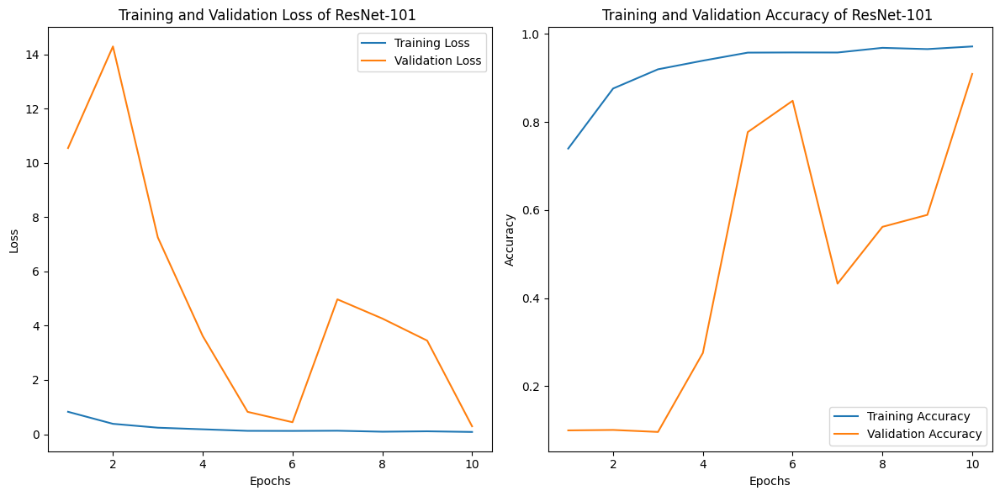

In [31]:
import matplotlib.pyplot as plt

# Access training history
train_loss = history_resnet101.history['loss']
val_loss = history_resnet101.history['val_loss']
train_accuracy = history_resnet101.history['accuracy']
val_accuracy = history_resnet101.history['val_accuracy']

# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(range(1, len(train_loss) + 1), train_loss, label='Training Loss')
plt.plot(range(1, len(val_loss) + 1), val_loss, label='Validation Loss')
plt.title('Training and Validation Loss of ResNet-101 ')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(range(1, len(train_accuracy) + 1), train_accuracy, label='Training Accuracy')
plt.plot(range(1, len(val_accuracy) + 1), val_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy of ResNet-101 ')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [32]:
model_resnet101.save('/kaggle/working/Tomato_ResNet101_kaggle.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [33]:
# Test Accuracy
test_loss, test_accuracy = model_resnet101.evaluate(test_ds)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")


32/32 [==============================] - 7s 213ms/step - loss: 0.3023 - accuracy: 0.9040
Test Loss: 0.3023
Test Accuracy: 0.9040


In [34]:
# Generate predictions using the model
predictions = model_resnet101.predict(val_gen.flow_from_directory(val_dir, target_size=imageShape, batch_size=batchSize, class_mode='categorical', shuffle=False))

Found 1000 images belonging to 10 classes.
32/32 [==============================] - 8s 185ms/step


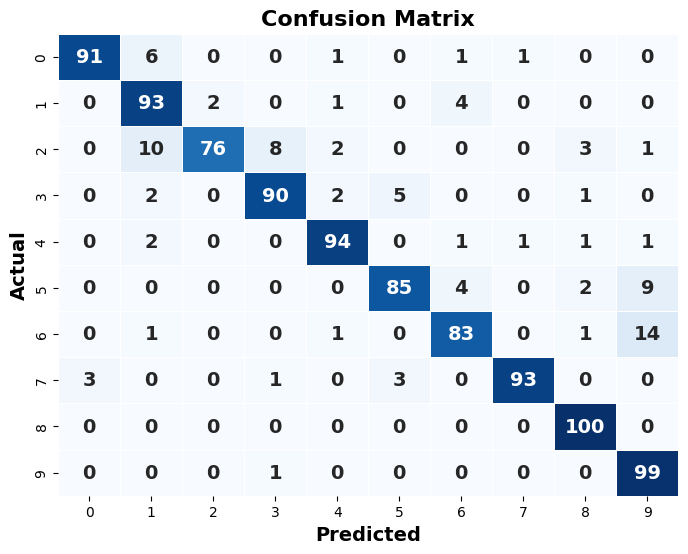

In [35]:
# Confusion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Get the true labels
true_labels = test_ds.classes

# Get the predicted labels
predicted_labels = np.argmax(predictions, axis=1)

# Compute the confusion matrix
confusion = confusion_matrix(true_labels, predicted_labels)

# Create a heatmap with Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', cbar=False,
            annot_kws={'size': 14, 'weight': 'bold'}, linewidths=.5)

# Customize labels and title
plt.xlabel('Predicted', fontsize=14, fontweight='bold')
plt.ylabel('Actual', fontsize=14, fontweight='bold')
plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
plt.show()

In [36]:
print("\033[1mThe Classification Report on Test Data\033[0m\n")
classification_rep = classification_report(true_labels, predicted_labels)
print(classification_rep)

The Classification Report on Test Data

              precision    recall  f1-score   support

           0       0.97      0.91      0.94       100
           1       0.82      0.93      0.87       100
           2       0.97      0.76      0.85       100
           3       0.90      0.90      0.90       100
           4       0.93      0.94      0.94       100
           5       0.91      0.85      0.88       100
           6       0.89      0.83      0.86       100
           7       0.98      0.93      0.95       100
           8       0.93      1.00      0.96       100
           9       0.80      0.99      0.88       100

    accuracy                           0.90      1000
   macro avg       0.91      0.90      0.90      1000
weighted avg       0.91      0.90      0.90      1000



## DenseNet121

In [37]:
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout

# Load the DenseNet-121 base model
base_model_densenet = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Create a Sequential model
model_densenet121 = Sequential()

# Add the DenseNet-121 base model
model_densenet121.add(base_model_densenet)

# Add custom classification layers
model_densenet121.add(GlobalAveragePooling2D())
model_densenet121.add(Dense(1024, activation='relu'))
model_densenet121.add(Dropout(0.5))
model_densenet121.add(Dense(10, activation='softmax'))  # num_classes is the number of disease classes (adjust to your dataset)

# Compile the model
model_densenet121.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


29084464/29084464 [==============================] - 0s 0us/step


In [38]:
# Train the model
history_densenet121 = model_densenet121.fit(
    train_ds,
    steps_per_epoch=train_ds.samples // 32,
    validation_data=val_ds,
    validation_steps=val_ds.samples // 32,
    epochs=10
)

Epoch 1/10
250/250 [==============================] - 174s 400ms/step - loss: 0.5732 - accuracy: 0.8273 - val_loss: 2.3636 - val_accuracy: 0.6159
Epoch 2/10
250/250 [==============================] - 98s 390ms/step - loss: 0.2823 - accuracy: 0.9147 - val_loss: 1.2289 - val_accuracy: 0.7419
Epoch 3/10
250/250 [==============================] - 98s 391ms/step - loss: 0.1912 - accuracy: 0.9386 - val_loss: 0.4882 - val_accuracy: 0.8760
Epoch 4/10
250/250 [==============================] - 102s 406ms/step - loss: 0.1707 - accuracy: 0.9434 - val_loss: 0.7233 - val_accuracy: 0.8599
Epoch 5/10
250/250 [==============================] - 101s 405ms/step - loss: 0.1606 - accuracy: 0.9536 - val_loss: 0.6102 - val_accuracy: 0.8438
Epoch 6/10
250/250 [==============================] - 97s 387ms/step - loss: 0.1208 - accuracy: 0.9622 - val_loss: 0.7606 - val_accuracy: 0.8281
Epoch 7/10
250/250 [==============================] - 101s 405ms/step - loss: 0.1091 - accuracy: 0.9661 - val_loss: 0.3801 - va

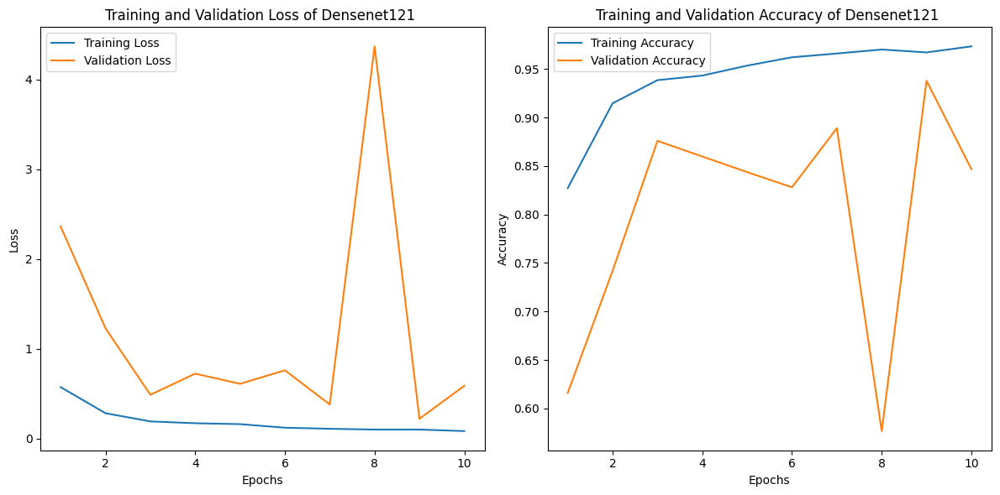

In [39]:
import matplotlib.pyplot as plt

# Access training history
train_loss = history_densenet121.history['loss']
val_loss = history_densenet121.history['val_loss']
train_accuracy = history_densenet121.history['accuracy']
val_accuracy = history_densenet121.history['val_accuracy']

# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(range(1, len(train_loss) + 1), train_loss, label='Training Loss')
plt.plot(range(1, len(val_loss) + 1), val_loss, label='Validation Loss')
plt.title('Training and Validation Loss of Densenet121 ')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(range(1, len(train_accuracy) + 1), train_accuracy, label='Training Accuracy')
plt.plot(range(1, len(val_accuracy) + 1), val_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy of Densenet121 ')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [40]:
model_densenet121.save('/kaggle/working/Tomato_DenseNet121_kaggle.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [41]:
# Test Accuracy
test_loss, test_accuracy = model_densenet121.evaluate(test_ds)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")


32/32 [==============================] - 6s 187ms/step - loss: 0.6345 - accuracy: 0.8340
Test Loss: 0.6345
Test Accuracy: 0.8340


In [42]:
# Generate predictions using the model
predictions = model_densenet121.predict(val_gen.flow_from_directory(val_dir, target_size=imageShape, batch_size=batchSize, class_mode='categorical', shuffle=False))

Found 1000 images belonging to 10 classes.
32/32 [==============================] - 5s 95ms/step


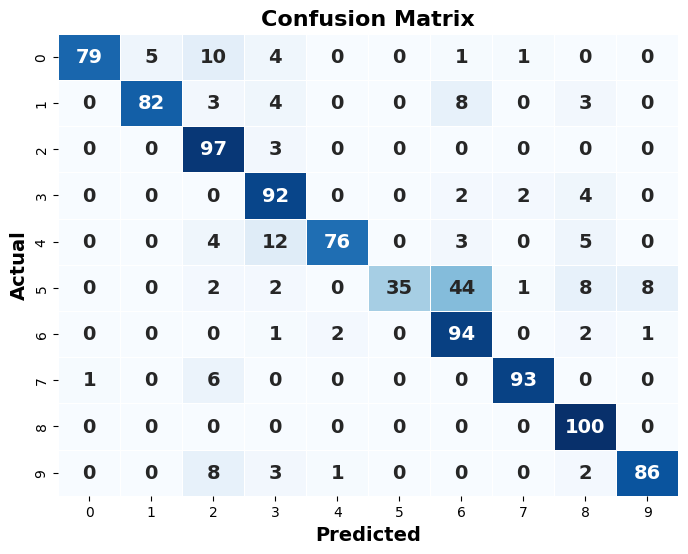

In [43]:
# Confusion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Get the true labels
true_labels = test_ds.classes

# Get the predicted labels
predicted_labels = np.argmax(predictions, axis=1)

# Compute the confusion matrix
confusion = confusion_matrix(true_labels, predicted_labels)

# Create a heatmap with Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', cbar=False,
            annot_kws={'size': 14, 'weight': 'bold'}, linewidths=.5)

# Customize labels and title
plt.xlabel('Predicted', fontsize=14, fontweight='bold')
plt.ylabel('Actual', fontsize=14, fontweight='bold')
plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
plt.show()

In [44]:
print("\033[1mThe Classification Report on Test Data\033[0m\n")
classification_rep = classification_report(true_labels, predicted_labels)
print(classification_rep)

The Classification Report on Test Data

              precision    recall  f1-score   support

           0       0.99      0.79      0.88       100
           1       0.94      0.82      0.88       100
           2       0.75      0.97      0.84       100
           3       0.76      0.92      0.83       100
           4       0.96      0.76      0.85       100
           5       1.00      0.35      0.52       100
           6       0.62      0.94      0.75       100
           7       0.96      0.93      0.94       100
           8       0.81      1.00      0.89       100
           9       0.91      0.86      0.88       100

    accuracy                           0.83      1000
   macro avg       0.87      0.83      0.83      1000
weighted avg       0.87      0.83      0.83      1000



## Xception Model

In [45]:
from tensorflow.keras.applications import Xception
# Load pre-trained Xception model without top (fully connected) layers
base_model_XP = Xception(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

for layer in base_model_XP.layers:
  layer.trainable = False

x = GlobalAveragePooling2D()(base_model_XP.output)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(10, activation='softmax')(x)


model_XP = Model(inputs=base_model_XP.input, outputs=output)

# Compile the model
model_XP.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

83683744/83683744 [==============================] - 0s 0us/step


In [46]:
# Train the model
history = model_XP.fit(
    train_ds,
    steps_per_epoch=train_ds.samples // 32,
    validation_data=val_ds,
    validation_steps=val_ds.samples // 32,
    epochs=10
)

Epoch 1/10
250/250 [==============================] - 59s 208ms/step - loss: 1.0881 - accuracy: 0.6290 - val_loss: 0.7026 - val_accuracy: 0.7692
Epoch 2/10
250/250 [==============================] - 48s 194ms/step - loss: 0.6699 - accuracy: 0.7719 - val_loss: 0.5860 - val_accuracy: 0.8140
Epoch 3/10
250/250 [==============================] - 49s 197ms/step - loss: 0.5500 - accuracy: 0.8114 - val_loss: 0.5267 - val_accuracy: 0.8271
Epoch 4/10
250/250 [==============================] - 48s 193ms/step - loss: 0.4782 - accuracy: 0.8331 - val_loss: 0.4653 - val_accuracy: 0.8422
Epoch 5/10
250/250 [==============================] - 49s 194ms/step - loss: 0.4110 - accuracy: 0.8584 - val_loss: 0.4516 - val_accuracy: 0.8382
Epoch 6/10
250/250 [==============================] - 49s 196ms/step - loss: 0.3874 - accuracy: 0.8665 - val_loss: 0.4506 - val_accuracy: 0.8518
Epoch 7/10
250/250 [==============================] - 50s 201ms/step - loss: 0.3417 - accuracy: 0.8852 - val_loss: 0.4319 - val_ac

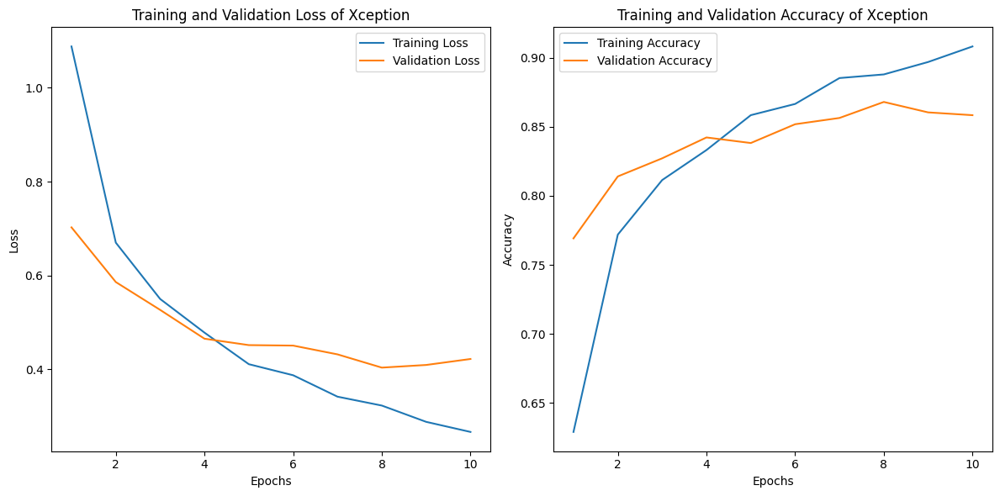

In [47]:
import matplotlib.pyplot as plt

# Access training history
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(range(1, len(train_loss) + 1), train_loss, label='Training Loss')
plt.plot(range(1, len(val_loss) + 1), val_loss, label='Validation Loss')
plt.title('Training and Validation Loss of Xception')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(range(1, len(train_accuracy) + 1), train_accuracy, label='Training Accuracy')
plt.plot(range(1, len(val_accuracy) + 1), val_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy of Xception')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [48]:
model_XP.save('/kaggle/working/Tomato_XP_kaggle.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [49]:
# Test Accuracy
test_loss, test_accuracy = model_XP.evaluate(test_ds)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

32/32 [==============================] - 6s 194ms/step - loss: 0.4966 - accuracy: 0.8450
Test Loss: 0.4966
Test Accuracy: 0.8450


In [50]:
# Generate predictions using the model
predictions = model_XP.predict(val_gen.flow_from_directory(val_dir, target_size=imageShape, batch_size=batchSize, class_mode='categorical', shuffle=False))

Found 1000 images belonging to 10 classes.
32/32 [==============================] - 6s 154ms/step


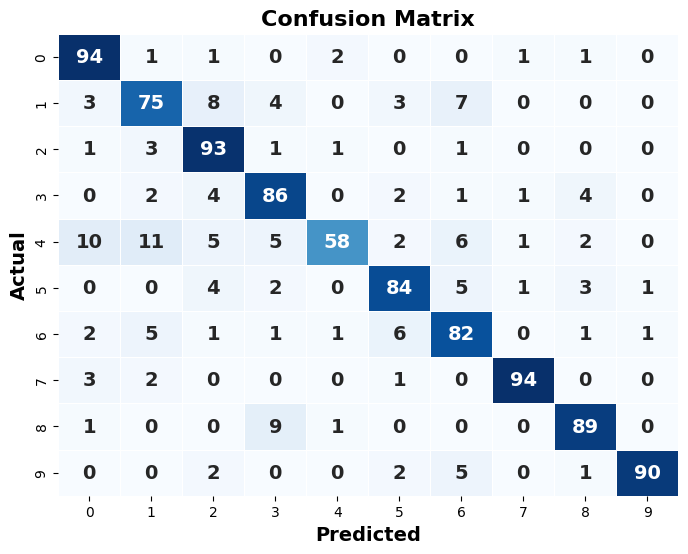

In [51]:
# Confusion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Get the true labels
true_labels = test_ds.classes

# Get the predicted labels
predicted_labels = np.argmax(predictions, axis=1)

# Compute the confusion matrix
confusion = confusion_matrix(true_labels, predicted_labels)

# Create a heatmap with Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', cbar=False,
            annot_kws={'size': 14, 'weight': 'bold'}, linewidths=.5)

# Customize labels and title
plt.xlabel('Predicted', fontsize=14, fontweight='bold')
plt.ylabel('Actual', fontsize=14, fontweight='bold')
plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
plt.show()

In [52]:
print("\033[1mThe Classification Report on Test Data\033[0m\n")
classification_rep = classification_report(true_labels, predicted_labels)
print(classification_rep)

The Classification Report on Test Data

              precision    recall  f1-score   support

           0       0.82      0.94      0.88       100
           1       0.76      0.75      0.75       100
           2       0.79      0.93      0.85       100
           3       0.80      0.86      0.83       100
           4       0.92      0.58      0.71       100
           5       0.84      0.84      0.84       100
           6       0.77      0.82      0.79       100
           7       0.96      0.94      0.95       100
           8       0.88      0.89      0.89       100
           9       0.98      0.90      0.94       100

    accuracy                           0.84      1000
   macro avg       0.85      0.84      0.84      1000
weighted avg       0.85      0.84      0.84      1000



1/1 [==============================] - 0s 30ms/step


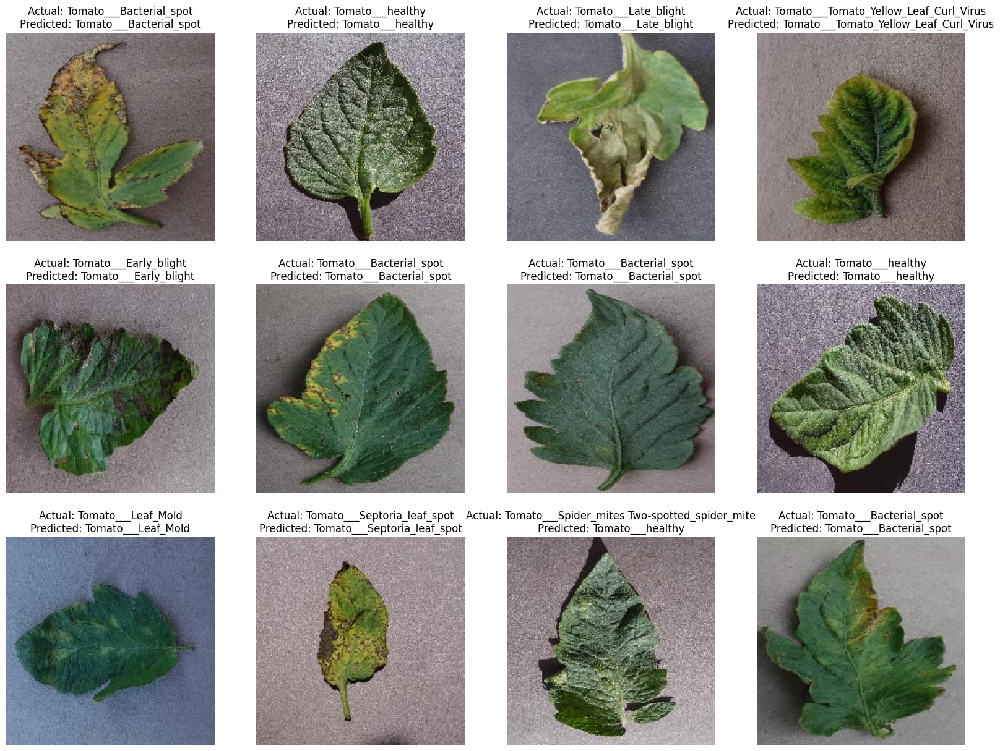

In [53]:
# Visualizing Predictions of best model
def predictImages(data, class_names, model):

    r, c = 3, 4
    imgLen = r * c
    plt.figure(figsize=(20, 15))
    i = 1
    counter = 0

    while counter < imgLen:
        images, labels = next(data)
        for j in range(len(images)):
            img = np.expand_dims(images[j], axis=0)

            plt.subplot(r, c, i)
            plt.imshow(img[0])

            predicted = model.predict(img)
            predicted = class_names[np.argmax(predicted)]
            actual = class_names[np.argmax(labels[j])]

            plt.title(f"Actual: {actual}\nPredicted: {predicted}")
            plt.axis('off')

            i += 1
            counter += 1

            if i > imgLen:
                break

    plt.show()

class_names = sorted(os.listdir(train_dir))
predictImages(test_ds, class_names, model_resnet101)


## Ensemble Model

In [54]:
import numpy as np
from tensorflow.keras.applications import MobileNet, ResNet50, VGG19, DenseNet201, InceptionV3
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Load pre-trained models
mobilenet_model = MobileNet(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
resnet50_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
vgg19_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
densenet201_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
inceptionv3_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers in each model
for model in [mobilenet_model, resnet50_model, vgg19_model, densenet201_model, inceptionv3_model]:
    model.trainable = False

# Create input layer
input_layer = Input(shape=(224, 224, 3))

# Get the output of each model after global average pooling
mobilenet_output = GlobalAveragePooling2D()(mobilenet_model(input_layer))
resnet50_output = GlobalAveragePooling2D()(resnet50_model(input_layer))
vgg19_output = GlobalAveragePooling2D()(vgg19_model(input_layer))
densenet201_output = GlobalAveragePooling2D()(densenet201_model(input_layer))
inceptionv3_output = GlobalAveragePooling2D()(inceptionv3_model(input_layer))

# Concatenate the outputs
merged_output = concatenate([mobilenet_output, resnet50_output, vgg19_output, densenet201_output, inceptionv3_output])

# Add classification layer
output_layer = Dense(10, activation='softmax')(merged_output)

# Create the ensemble model
ensemble_model = Model(inputs=input_layer, outputs=output_layer)

# Compile the model
ensemble_model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Print model summary
ensemble_model.summary()

74836368/74836368 [==============================] - 0s 0us/step
Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_11 (InputLayer)       [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 mobilenet_1.00_224 (Functi  (None, 7, 7, 1024)           3228864   ['input_11[0][0]']            
 onal)                                                                                            
                                                                                                  
 resnet50 (Functional)       (None, 7, 7, 2048)           2358771   ['input_11[0][0]']            
                                                          2                                       
                           

In [55]:
# Train the model
history = ensemble_model.fit(
    train_ds,
    steps_per_epoch=train_ds.samples // 32,
    validation_data=val_ds,
    validation_steps=val_ds.samples // 32,
    epochs=10
)

Epoch 1/10
250/250 [==============================] - 211s 735ms/step - loss: 0.6535 - accuracy: 0.7935 - val_loss: 0.3549 - val_accuracy: 0.8906
Epoch 2/10
250/250 [==============================] - 175s 701ms/step - loss: 0.2186 - accuracy: 0.9413 - val_loss: 0.2135 - val_accuracy: 0.9299
Epoch 3/10
250/250 [==============================] - 175s 702ms/step - loss: 0.1387 - accuracy: 0.9666 - val_loss: 0.1852 - val_accuracy: 0.9420
Epoch 4/10
250/250 [==============================] - 167s 667ms/step - loss: 0.0959 - accuracy: 0.9800 - val_loss: 0.1623 - val_accuracy: 0.9456
Epoch 5/10
250/250 [==============================] - 167s 668ms/step - loss: 0.0665 - accuracy: 0.9876 - val_loss: 0.1395 - val_accuracy: 0.9521
Epoch 6/10
250/250 [==============================] - 166s 662ms/step - loss: 0.0498 - accuracy: 0.9926 - val_loss: 0.1490 - val_accuracy: 0.9506
Epoch 7/10
250/250 [==============================] - 174s 696ms/step - loss: 0.0385 - accuracy: 0.9965 - val_loss: 0.1267 -

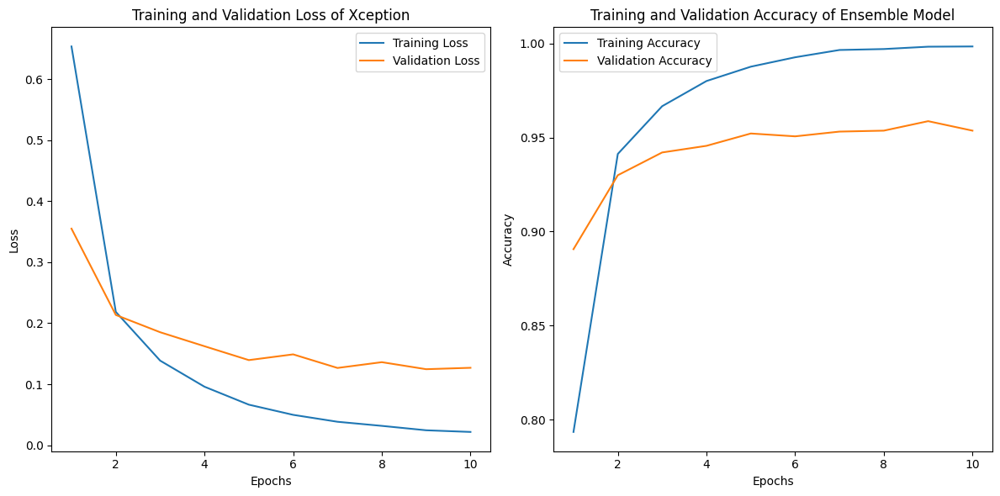

In [56]:
import matplotlib.pyplot as plt

# Access training history
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(range(1, len(train_loss) + 1), train_loss, label='Training Loss')
plt.plot(range(1, len(val_loss) + 1), val_loss, label='Validation Loss')
plt.title('Training and Validation Loss of Xception')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(range(1, len(train_accuracy) + 1), train_accuracy, label='Training Accuracy')
plt.plot(range(1, len(val_accuracy) + 1), val_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy of Ensemble Model')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [57]:
# Test Accuracy
test_loss, test_accuracy = ensemble_model.evaluate(test_ds)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

32/32 [==============================] - 19s 601ms/step - loss: 0.1752 - accuracy: 0.9350
Test Loss: 0.1752
Test Accuracy: 0.9350


In [58]:
# Generate predictions using the model
predictions = ensemble_model.predict(val_gen.flow_from_directory(val_dir, target_size=imageShape, batch_size=batchSize, class_mode='categorical', shuffle=False))

Found 1000 images belonging to 10 classes.
32/32 [==============================] - 24s 528ms/step


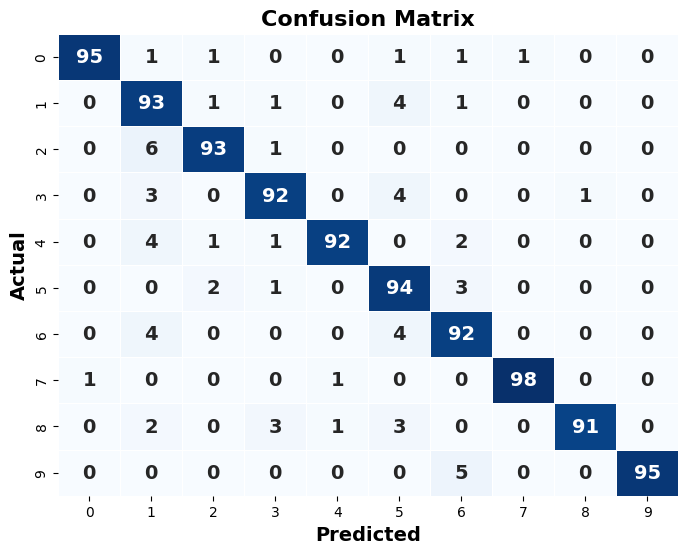

In [59]:
# Confusion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Get the true labels
true_labels = test_ds.classes

# Get the predicted labels
predicted_labels = np.argmax(predictions, axis=1)

# Compute the confusion matrix
confusion = confusion_matrix(true_labels, predicted_labels)

# Create a heatmap with Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', cbar=False,
            annot_kws={'size': 14, 'weight': 'bold'}, linewidths=.5)

# Customize labels and title
plt.xlabel('Predicted', fontsize=14, fontweight='bold')
plt.ylabel('Actual', fontsize=14, fontweight='bold')
plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
plt.show()

In [60]:
print("\033[1mThe Classification Report on Test Data\033[0m\n")
classification_rep = classification_report(true_labels, predicted_labels)
print(classification_rep)

The Classification Report on Test Data

              precision    recall  f1-score   support

           0       0.99      0.95      0.97       100
           1       0.82      0.93      0.87       100
           2       0.95      0.93      0.94       100
           3       0.93      0.92      0.92       100
           4       0.98      0.92      0.95       100
           5       0.85      0.94      0.90       100
           6       0.88      0.92      0.90       100
           7       0.99      0.98      0.98       100
           8       0.99      0.91      0.95       100
           9       1.00      0.95      0.97       100

    accuracy                           0.94      1000
   macro avg       0.94      0.93      0.94      1000
weighted avg       0.94      0.94      0.94      1000



1/1 [==============================] - 0s 68ms/step


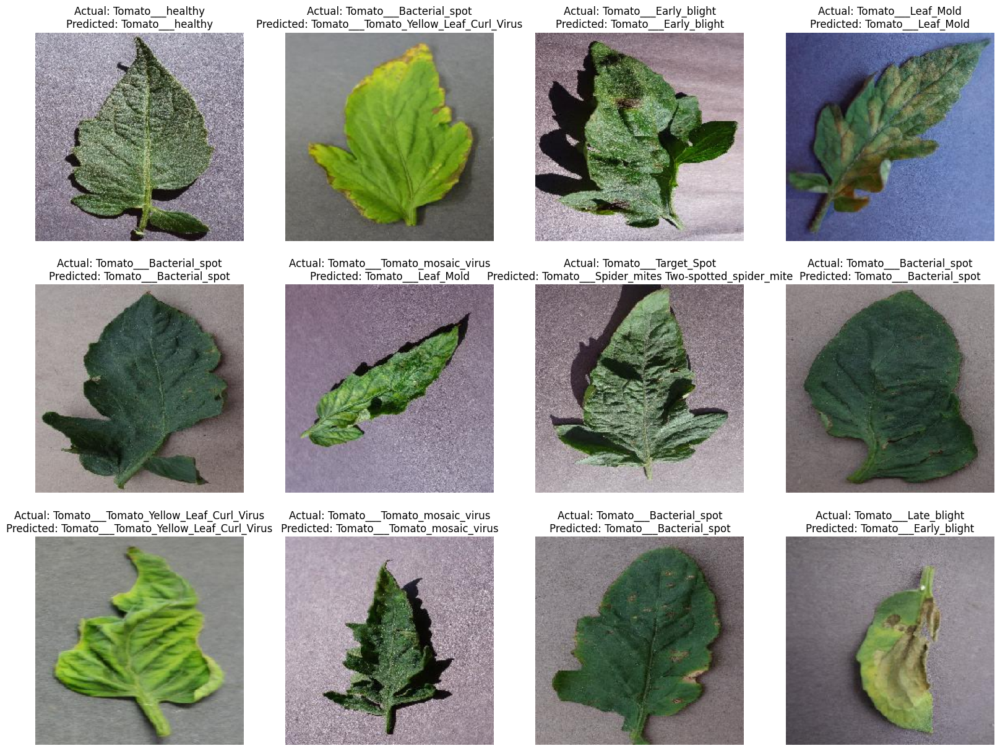

In [61]:
# Visualizing Predictions of best model
def predictImages(data, class_names, model):

    r, c = 3, 4
    imgLen = r * c
    plt.figure(figsize=(20, 15))
    i = 1
    counter = 0

    while counter < imgLen:
        images, labels = next(data)
        for j in range(len(images)):
            img = np.expand_dims(images[j], axis=0)

            plt.subplot(r, c, i)
            plt.imshow(img[0])

            predicted = model.predict(img)
            predicted = class_names[np.argmax(predicted)]
            actual = class_names[np.argmax(labels[j])]

            plt.title(f"Actual: {actual}\nPredicted: {predicted}")
            plt.axis('off')

            i += 1
            counter += 1

            if i > imgLen:
                break

    plt.show()

class_names = sorted(os.listdir(train_dir))
predictImages(test_ds, class_names, ensemble_model)
